In [406]:
import json
import pandas as pd
import geopandas as gpd

# BORNES RECHARGES ELECTRIQUES

In [461]:
url_bornes = 'data_charleville_bornes_elec.csv'
df_bornes = pd.read_csv(url_bornes, sep=';')
df_bornes.head()

,nom_amenageur,siren_amenageur,contact_amenageur,nom_operateur,contact_operateur,telephone_operateur,nom_enseigne,id_station_itinerance,id_station_local,nom_station,...,reservation,horaires,accessibilite_pmr,restriction_gabarit,station_deux_roues,raccordement,num_pdl,date_mise_en_service,observations,date_maj
0,NaN,NaN,NaN,Ardennes Métropole,NaN,NaN,NaN,Non concerné,NaN,NaN,...,NaN,NaN,Accessibilité inconnue,NaN,NaN,NaN,NaN,NaN,node/8137623243,2021-06-19
1,NaN,NaN,NaN,Ardennes Métropole,NaN,NaN,NaN,Non concerné,NaN,NaN,...,NaN,NaN,Accessibilité inconnue,NaN,NaN,NaN,NaN,NaN,node/8137623242,2021-06-19
2,NaN,NaN,NaN,Ardennes Métropole,NaN,NaN,NaN,Non concerné,NaN,NaN,...,NaN,NaN,Accessibilité inconnue,NaN,NaN,NaN,NaN,NaN,node/7796160785,2021-06-18
3,NaN,NaN,NaN,Ardennes Métropole,NaN,NaN,NaN,Non concerné,NaN,NaN,...,NaN,NaN,Accessibilité inconnue,NaN,NaN,NaN,NaN,NaN,node/7796192786,2021-06-19
4,NaN,NaN,NaN,Clem,NaN,NaN,NaN,Non concerné,NaN,AM 104 - Charleville-Mezieres - Parc des Expo,...,NaN,24/7,Accessibilité inconnue,NaN,NaN,NaN,NaN,NaN,node/6128532958,2019-11-10


In [ ]:
df_bornes.info()

In [ ]:
df_bornes.iloc[0]

In [ ]:
df_bornes['lon'] = df_bornes['coordonneesXY'].apply(lambda x: x.split(',')[0][1:]).astype(float)
df_bornes['lat'] = df_bornes['coordonneesXY'].apply(lambda x: x.split(',')[1][:-1]).astype(float)
#df_bornes['puissance'] = df_bornes['properties.type_borne'].apply(lambda x : x.split('kW')[0]).astype(int)
df_bornes.iloc[0]

# PARKINGS VELO

In [463]:
url_velos = 'data_charleville_parking_velo.csv'
df_velos = pd.read_csv(url_velos, sep=';')
df_velos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68 entries, 0 to 67
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id_local        68 non-null     object 
 1   id_osm          68 non-null     object 
 2   code_com        68 non-null     int64  
 3   coordonneesxy   68 non-null     object 
 4   capacite        65 non-null     float64
 5   capacite_cargo  0 non-null      float64
 6   type_accroche   61 non-null     object 
 7   mobilier        68 non-null     object 
 8   acces           68 non-null     object 
 9   gratuit         68 non-null     bool   
 10  protection      68 non-null     object 
 11  couverture      68 non-null     bool   
 12  surveillance    68 non-null     bool   
 13  lumiere         0 non-null      float64
 14  url_info        0 non-null      float64
 15  d_service       0 non-null      float64
 16  source          68 non-null     object 
 17  proprietaire    0 non-null      float

In [464]:
df_velos['lon'] = df_velos['coordonneesxy'].apply(lambda x: x.split(',')[0][1:]).astype(float)
df_velos['lat'] = df_velos['coordonneesxy'].apply(lambda x: x.split(',')[1][:-1]).astype(float)
df_velos['capacite'].fillna(0, inplace = True)

In [441]:
df_velos.mobilier.unique()

array(['ARCEAU', 'AUTRE', 'RATELIER', 'POTELET'], dtype=object)

# ARRÊTS BUS

In [465]:
url = "data_charleville_bus.geojson"
df_bus = pd.DataFrame()
data = pd.read_json(url)
df_bus = pd.json_normalize(data['features'])
df_bus = df_bus[df_bus['geometry.type'] == 'Point']
df_bus

,type,id,properties.@id,properties.area,properties.public_transport,properties.railway,properties.source,properties.train,geometry.type,geometry.coordinates,...,properties.check_date:shelter,properties.departures_board,properties.ref,properties.lit,properties.surface,properties.bin,properties.wheelchair,properties.route_ref,properties.crossing,properties.crossing_ref
18,Feature,node/287328100,node/287328100,NaN,stop_position,stop,Bing ; SNCF Réseau,yes,Point,"[4.7332765, 49.7526958]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19,Feature,node/287891201,node/287891201,NaN,stop_position,NaN,NaN,NaN,Point,"[4.706692, 49.7384232]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20,Feature,node/288405217,node/288405217,NaN,stop_position,NaN,NaN,NaN,Point,"[4.7243127, 49.7476439]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21,Feature,node/381210027,node/381210027,NaN,stop_position,NaN,NaN,NaN,Point,"[4.6960697, 49.7791293]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22,Feature,node/413594359,node/413594359,NaN,stop_position,stop,Bing ; SNCF Réseau,yes,Point,"[4.74266, 49.8119624]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515,Feature,node/10002764022,node/10002764022,NaN,platform,NaN,NaN,NaN,Point,"[4.754817, 49.7280039]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
516,Feature,node/10003058230,node/10003058230,NaN,platform,NaN,NaN,NaN,Point,"[4.7265304, 49.742133]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
517,Feature,node/10003058231,node/10003058231,NaN,platform,NaN,NaN,NaN,Point,"[4.726869, 49.7423699]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
518,Feature,node/10003058245,node/10003058245,NaN,platform,NaN,NaN,NaN,Point,"[4.7251454, 49.7476302]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [466]:
df_bus['lon'] = df_bus['geometry.coordinates'].apply(lambda x: x[0])
df_bus['lat'] = df_bus['geometry.coordinates'].apply(lambda x : x[1])
#df_bus

In [472]:
df_bus = df_bus[~df_bus['properties.name'].isna()]
df_bus

,type,id,properties.@id,properties.area,properties.public_transport,properties.railway,properties.source,properties.train,geometry.type,geometry.coordinates,...,properties.ref,properties.lit,properties.surface,properties.bin,properties.wheelchair,properties.route_ref,properties.crossing,properties.crossing_ref,lon,lat
18,Feature,node/287328100,node/287328100,NaN,stop_position,stop,Bing ; SNCF Réseau,yes,Point,"[4.7332765, 49.7526958]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.733276,49.752696
22,Feature,node/413594359,node/413594359,NaN,stop_position,stop,Bing ; SNCF Réseau,yes,Point,"[4.74266, 49.8119624]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.742660,49.811962
30,Feature,node/1601183535,node/1601183535,NaN,platform,NaN,Bing;cadastre-dgi-fr source : Direction Généra...,NaN,Point,"[4.7132507, 49.7290482]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.713251,49.729048
31,Feature,node/1601183541,node/1601183541,NaN,platform,NaN,Bing;cadastre-dgi-fr source : Direction Généra...,NaN,Point,"[4.7134417, 49.7290909]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.713442,49.729091
32,Feature,node/1601248632,node/1601248632,NaN,NaN,NaN,Bing;cadastre-dgi-fr source : Direction Généra...,NaN,Point,"[4.7180188, 49.7322955]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.718019,49.732295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
493,Feature,node/8342119357,node/8342119357,NaN,platform,NaN,NaN,NaN,Point,"[4.6793891, 49.7854679]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.679389,49.785468
494,Feature,node/8342119358,node/8342119358,NaN,platform,NaN,NaN,NaN,Point,"[4.6797501, 49.7855108]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.679750,49.785511
496,Feature,node/8342178867,node/8342178867,NaN,platform,NaN,NaN,NaN,Point,"[4.6765576, 49.7977357]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.676558,49.797736
499,Feature,node/8342178870,node/8342178870,NaN,platform,NaN,NaN,NaN,Point,"[4.6697514, 49.8109492]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.669751,49.810949


In [468]:
df_bus.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 502 entries, 18 to 519
Data columns (total 38 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   type                                502 non-null    object 
 1   id                                  502 non-null    object 
 2   properties.@id                      502 non-null    object 
 3   properties.area                     0 non-null      object 
 4   properties.public_transport         500 non-null    object 
 5   properties.railway                  12 non-null     object 
 6   properties.source                   20 non-null     object 
 7   properties.train                    12 non-null     object 
 8   geometry.type                       502 non-null    object 
 9   geometry.coordinates                502 non-null    object 
 10  properties.level                    0 non-null      object 
 11  properties.tactile_paving           84 non-n

# GRAPHIQUES

In [415]:
import plotly.express as px
import plotly.graph_objects as go
import matplotlib as plt

#mapbox_access_token = open(".mapbox_token").read()


## Bornes Autos

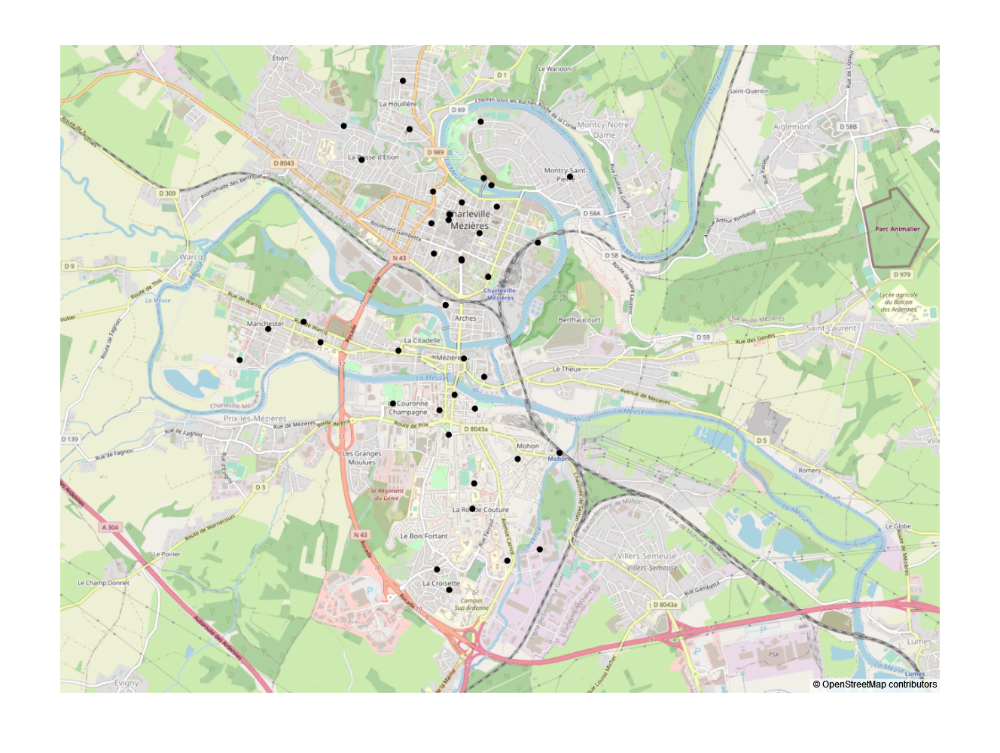

In [455]:
fig = px.scatter_mapbox(df_bornes, lat = "lat", lon = "lon",
                        zoom = 12.7,
                        center = {"lat" : 49.76, 'lon': 4.725},
                        mapbox_style = 'open-street-map',
                        width = 1000, height = 1000,
                        hover_name = "nom_station",                        
                        size = 'nbre_pdc',
                        hover_data = {'nbre_pdc': False},
                        #color = 'condition_acces',
                        color_discrete_sequence=["black"],
                        
                        #labels = {'puissance' : 'puissance en kW'}
                     )
                                                                             
fig.update_traces(marker={'size': 9})                                                                                                                     
#fig.update_layout(title = dict({'text':'Bornes de recharges électriques', 'x' : 0.2, 'xanchor': 'center'}))
fig.show()

## Parkings Vélo

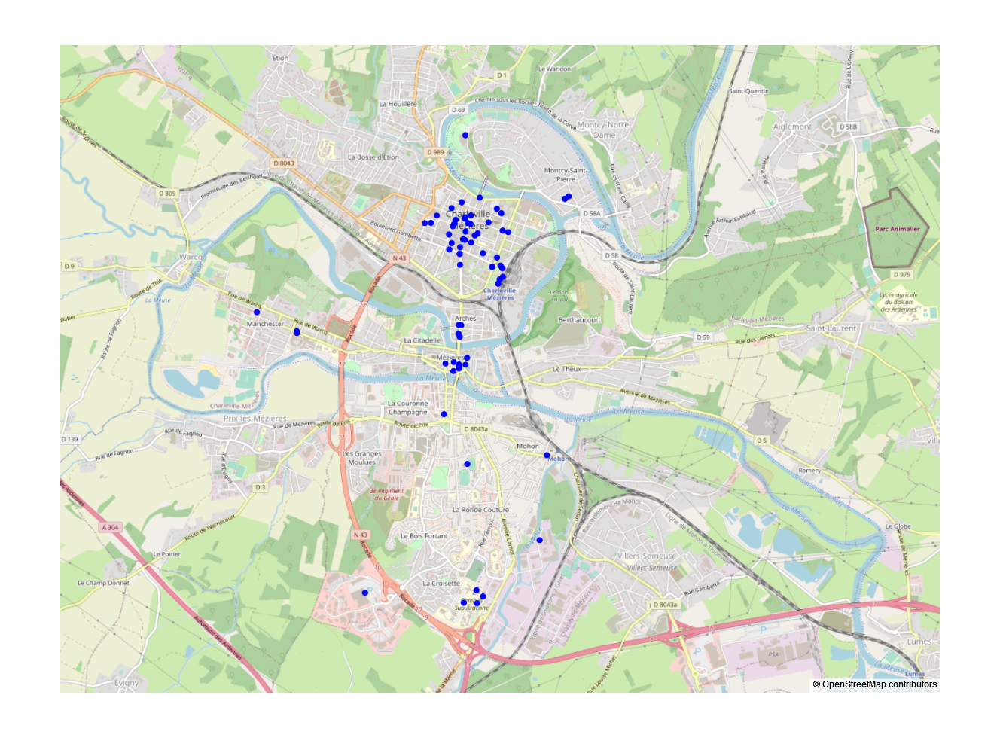

In [456]:
fig2 = px.scatter_mapbox(df_velos, lat = "lat", lon = "lon",
                        zoom = 12.7,
                        center = {"lat" : 49.76, 'lon': 4.725},
                        mapbox_style = 'open-street-map',
                        width = 1000, height = 1000,
                        hover_name = "mobilier",
                        #hover_data = {'size': False},
                        #size = "capacite",
                        color_discrete_sequence = ['blue'],
                        #color = 'capacite',
                        #color_continuous_scale = 'Bluered',
                        #color_continuaous
                        labels = {'capacite' : 'Capacité Vélos'}
                     )                                                                                                            
fig2.update_traces(marker={'size': 9})                                                                                                                       
#fig2.update_layout(title = dict({'text':'vélos', 'x' : 0.2, 'xanchor': 'center'}),
                 # legend=dict(orientation="h"))
fig2.show()

## Arrêts Bus

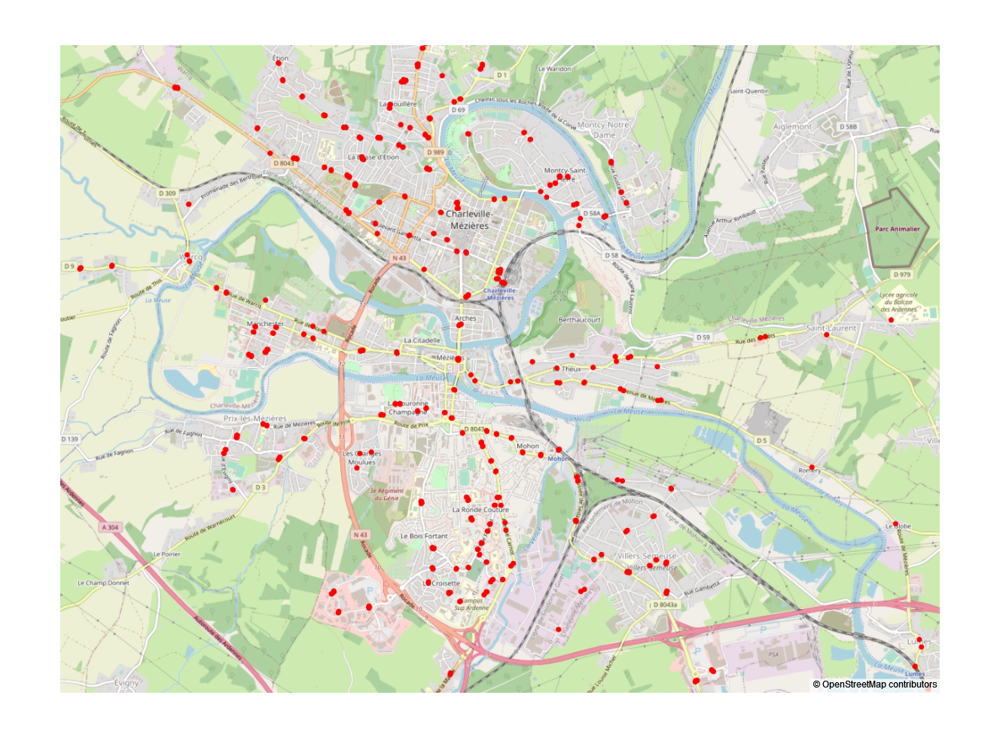

In [457]:
fig_bus = px.scatter_mapbox(df_bus, lat = "lat", lon = "lon",
                        zoom = 12.7,
                        center = {"lat" : 49.76, 'lon': 4.725},
                        mapbox_style = 'open-street-map',
                        width = 1000, height = 1000,
                        hover_name = "properties.name",                        
                        color_discrete_sequence = ['red'],                        
                     )                                                                                                            
                 
fig_bus.update_traces(marker={'size': 8})  

fig_bus.show()

## Bornes Autos + Parking Vélo

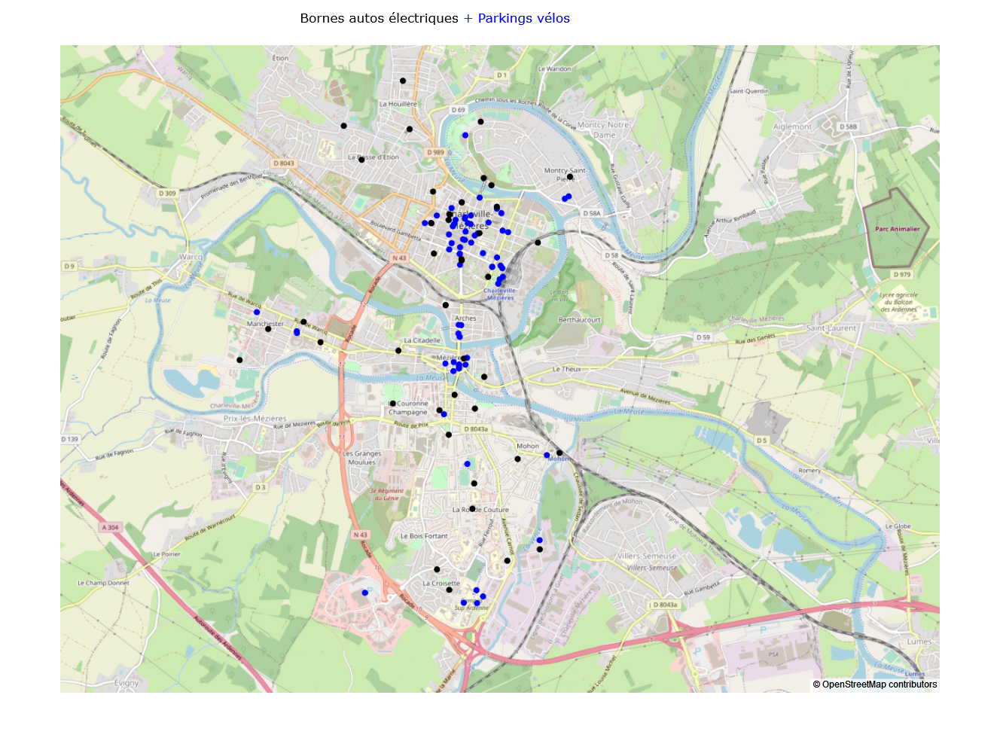

In [458]:
for datas in fig.data:
    fig2.add_trace(datas)
fig2.update_layout(title = dict({'text':'<span style="color:black;">Bornes autos électriques</span> + <span style="color:blue;">Parkings vélos</span>', 'x' : 0.3})) #, legend = dict(orientation = 'h'))
fig2.show()

## Bornes Autos + Parkings Vélos + Arrêts Bus

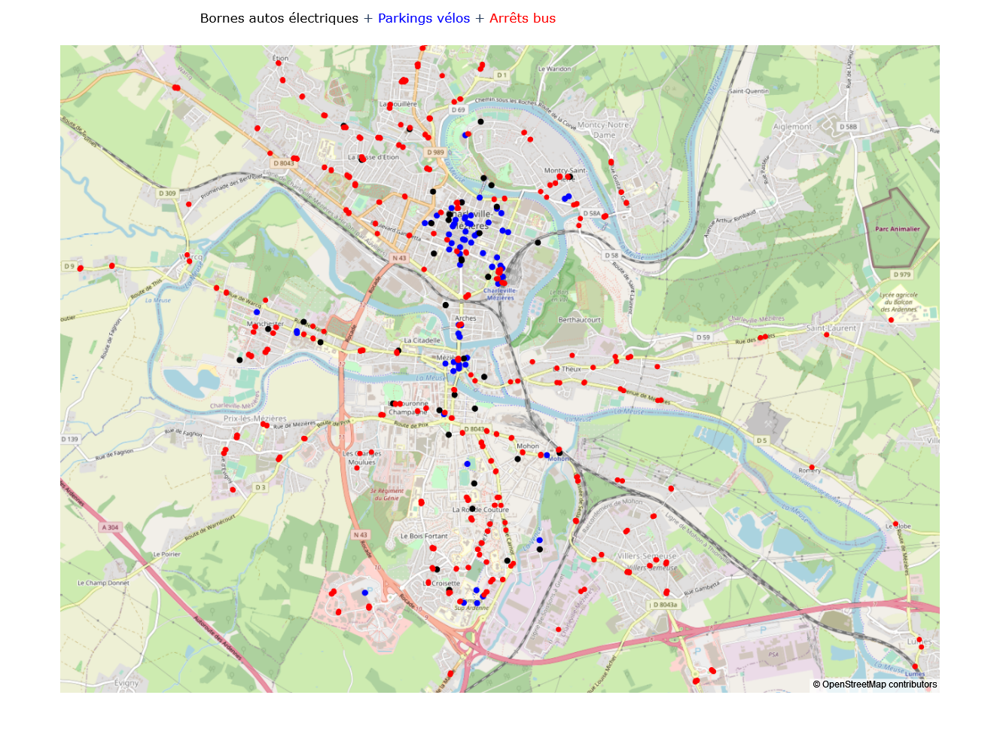

In [459]:
for datas in fig_bus.data:
    fig2.add_trace(datas)
fig2.update_layout(title = dict({'text':'<span style="color:black;">Bornes autos électriques</span> + <span style="color:blue;">Parkings vélos</span> + <span style="color:red;">Arrêts bus</span>',
                                 'x' : 0.2}))

fig2.show()


In [460]:
path = "Charleville_autos_velos_bus.html"
html = fig2.to_html()

with open(path, "w", encoding="utf-8") as f:
    f.write(html)